## Modelo de previsão de preço médio de imóvel no Rio de Janeiro

### Importações

In [1]:
import pandas as pd
import pathlib
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px # para visualizar mapa
from sklearn.metrics import r2_score, mean_squared_error # para métricas de análise do melhor modelo ou de menor erro
from sklearn.linear_model import LinearRegression # modelos lineares
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor # modelos árvores de decisão
from sklearn.model_selection import train_test_split

### Bases de dados

In [2]:
meses = {'jan': 1, 'fev': 2, 'mar': 3, 'abr': 4, 'mai': 5, 'jun': 6, 'jul': 7, 'ago': 8, 'set': 9, 'out': 10, 'nov': 11, 'dez': 12}

caminho_bases = pathlib.Path('dataset')

base_airbnb = []

for arquivo in caminho_bases.iterdir(): 
    nome_mes = arquivo.name[:3] 
    mes = meses[nome_mes] 
    ano = arquivo.name[-8:] 
    ano = int(ano.replace('.csv', '')) 
    
    df = pd.read_csv(caminho_bases / arquivo.name, low_memory=False)
    df['year'] = ano 
    df['month'] = mes 
    
    base_airbnb.append(df) 

base_airbnb = pd.concat(base_airbnb, ignore_index=True)

display(base_airbnb)


,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,number_of_reviews_ltm,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,14063,https://www.airbnb.com/rooms/14063,20180414160018,2018-04-14,Living in a Postcard,"Besides the most iconic's view, our apartment ...",NaN,"Besides the most iconic's view, our apartment ...",none,Best and favorite neighborhood of Rio. Perfect...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,17878,https://www.airbnb.com/rooms/17878,20180414160018,2018-04-14,Very Nice 2Br - Copacabana - WiFi,Please note that special rates apply for New Y...,- large balcony which looks out on pedestrian ...,Please note that special rates apply for New Y...,none,This is the best spot in Rio. Everything happe...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,24480,https://www.airbnb.com/rooms/24480,20180414160018,2018-04-14,Nice and cozy near Ipanema Beach,My studio is located in the best of Ipanema. ...,The studio is located at Vinicius de Moraes St...,My studio is located in the best of Ipanema. ...,none,"The beach, the lagoon, Ipanema is a great loca...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,25026,https://www.airbnb.com/rooms/25026,20180414160018,2018-04-14,Beautiful Modern Decorated Studio in Copa,"Our apartment is a little gem, everyone loves ...",This newly renovated studio (last renovations ...,"Our apartment is a little gem, everyone loves ...",none,Copacabana is a lively neighborhood and the ap...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,31560,https://www.airbnb.com/rooms/31560,20180414160018,2018-04-14,NICE & COZY 1BDR - IPANEMA BEACH,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,This nice and clean 1 bedroom apartment is loc...,none,Die Nachbarschaft von Ipanema ist super lebend...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,38844730,https://www.airbnb.com/rooms/38844730,20190923212307,2019-09-24,TRANSAMERICA BARRA DA TIJUCA R IV,"Em estilo contemporâneo, o Transamerica Prime ...",NaN,"Em estilo contemporâneo, o Transamerica Prime ...",none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,15.0,0.0,0.0
902206,38846408,https://www.airbnb.com/rooms/38846408,20190923212307,2019-09-24,Alugo para o Rock in Rio,"Confortável apartamento, 2 quartos , sendo 1 s...",O apartamento estará com mobília completa disp...,"Confortável apartamento, 2 quartos , sendo 1 s...",none,"Muito próximo ao Parque Olímpico, local do eve...",...,2.0,2.0,1125.0,1125.0,2.0,1125.0,0.0,1.0,0.0,0.0
902207,38846703,https://www.airbnb.com/rooms/38846703,20190923212307,2019-09-24,Apt COMPLETO em COPACABANA c/TOTAL SEGURANÇA,Apartamento quarto e sala COMPLETO para curtas...,Espaço ideal para até 5 pessoas. Cama de casal...,Apartamento quarto e sala COMPLETO para curtas...,none,NaN,...,3.0,3.0,1125.0,1125.0,3.0,1125.0,0.0,23.0,6.0,0.0
902208,38847050,https://www.airbnb.com/rooms/38847050,20190923212307,2019-09-24,Cobertura Cinematografica,Cobertura alto nivel,NaN,Cobertura alto nivel,none,NaN,...,1.0,1.0,1125.0,1125.0,1.0,1125.0,0.0,1.0,0.0,0.0


### Tratamentos Geral na Base de Dados

- Colunas necessárias, ou seja, excluir colunas desnecessárias.
- Valores faltantes.
- Transformar o tipo do dado, ou seja, para estarem de acordo com o que condizem.

#### Colunas necessárias


In [3]:
colunas = ['host_response_time','host_response_rate','host_is_superhost','host_listings_count','latitude','longitude','property_type','room_type','accommodates','bathrooms','bedrooms','beds','bed_type','amenities','price','security_deposit','cleaning_fee','guests_included','extra_people','minimum_nights','maximum_nights','number_of_reviews','review_scores_rating','review_scores_accuracy','review_scores_cleanliness','review_scores_checkin','review_scores_communication','review_scores_location','review_scores_value','instant_bookable','is_business_travel_ready','cancellation_policy','year','month']

# dataframe com as colunas determinadas
base_airbnb = base_airbnb.loc[:, colunas]
print(list(base_airbnb.columns))
display(base_airbnb)

['host_response_time', 'host_response_rate', 'host_is_superhost', 'host_listings_count', 'latitude', 'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'bed_type', 'amenities', 'price', 'security_deposit', 'cleaning_fee', 'guests_included', 'extra_people', 'minimum_nights', 'maximum_nights', 'number_of_reviews', 'review_scores_rating', 'review_scores_accuracy', 'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 'review_scores_value', 'instant_bookable', 'is_business_travel_ready', 'cancellation_policy', 'year', 'month']


,host_response_time,host_response_rate,host_is_superhost,host_listings_count,latitude,longitude,property_type,room_type,accommodates,bathrooms,...,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,is_business_travel_ready,cancellation_policy,year,month
0,NaN,NaN,f,1.0,-22.946854,-43.182737,Apartment,Entire home/apt,4,1.0,...,9.0,9.0,9.0,9.0,9.0,f,f,strict_14_with_grace_period,2018,4
1,within an hour,100%,t,2.0,-22.965919,-43.178962,Condominium,Entire home/apt,5,1.0,...,9.0,10.0,10.0,9.0,9.0,t,f,strict,2018,4
2,within an hour,100%,f,1.0,-22.985698,-43.201935,Apartment,Entire home/apt,2,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
3,within an hour,100%,f,3.0,-22.977117,-43.190454,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,9.0,f,f,strict,2018,4
4,within an hour,100%,t,1.0,-22.983024,-43.214270,Apartment,Entire home/apt,3,1.0,...,10.0,10.0,10.0,10.0,9.0,t,f,strict,2018,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
902205,within an hour,93%,f,0.0,-23.003180,-43.342840,Apartment,Entire home/apt,4,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
902206,NaN,NaN,f,0.0,-22.966640,-43.393450,Apartment,Entire home/apt,4,2.0,...,NaN,NaN,NaN,NaN,NaN,f,f,flexible,2019,9
902207,within a few hours,74%,f,32.0,-22.962080,-43.175520,Apartment,Entire home/apt,5,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9
902208,NaN,NaN,f,0.0,-23.003400,-43.341820,Apartment,Entire home/apt,4,1.0,...,NaN,NaN,NaN,NaN,NaN,f,f,strict_14_with_grace_period,2019,9


#### Valores Faltantes

- Colunas com mais de 300.000 valores NaN serão excluídas da análise.
- Nas outras colunas (mais de 900.000 linhas) serão excluídas as linhas que contém dados NaN.

In [4]:
# colunas

for coluna in base_airbnb:
    if base_airbnb[coluna].isnull().sum() > 300000: 
        base_airbnb = base_airbnb.drop(coluna, axis=1)

print(base_airbnb.isnull().sum())

host_is_superhost            460
host_listings_count          460
latitude                       0
longitude                      0
property_type                  0
room_type                      0
accommodates                   0
bathrooms                   1724
bedrooms                     850
beds                        2502
bed_type                       0
amenities                      0
price                          0
guests_included                0
extra_people                   0
minimum_nights                 0
maximum_nights                 0
number_of_reviews              0
instant_bookable               0
is_business_travel_ready       0
cancellation_policy            0
year                           0
month                          0
dtype: int64


In [5]:
# linhas

base_airbnb = base_airbnb.dropna()

print(base_airbnb.shape)
print(base_airbnb.isnull().sum())

(897709, 23)
host_is_superhost           0
host_listings_count         0
latitude                    0
longitude                   0
property_type               0
room_type                   0
accommodates                0
bathrooms                   0
bedrooms                    0
beds                        0
bed_type                    0
amenities                   0
price                       0
guests_included             0
extra_people                0
minimum_nights              0
maximum_nights              0
number_of_reviews           0
instant_bookable            0
is_business_travel_ready    0
cancellation_policy         0
year                        0
month                       0
dtype: int64


#### Transformar o tipo do dado

In [6]:
# verificar os tipos dos dados em cada coluna
print(base_airbnb.dtypes)
print('-'*60)
print(base_airbnb.iloc[0])

host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                        object
guests_included               int64
extra_people                 object
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
year                          int64
month                         int64
dtype: object
------------------------------------------------------------
host_is_superhost                                                           f
host_listings_count

In [7]:
# price reconhecido como object, passar para float
base_airbnb['price'] = base_airbnb['price'].str.replace('$', '')
base_airbnb['price'] = base_airbnb['price'].str.replace(',', '')
base_airbnb['price'] = base_airbnb['price'].astype(np.float32, copy=False)

#extra people reconhecido como object, passar para float
base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace('$', '')
base_airbnb['extra_people'] = base_airbnb['extra_people'].str.replace(',', '')
base_airbnb['extra_people'] = base_airbnb['extra_people'].astype(np.float32, copy=False) 

#verificando os tipos
print(base_airbnb.dtypes)

host_is_superhost            object
host_listings_count         float64
latitude                    float64
longitude                   float64
property_type                object
room_type                    object
accommodates                  int64
bathrooms                   float64
bedrooms                    float64
beds                        float64
bed_type                     object
amenities                    object
price                       float32
guests_included               int64
extra_people                float32
minimum_nights                int64
maximum_nights                int64
number_of_reviews             int64
instant_bookable             object
is_business_travel_ready     object
cancellation_policy          object
year                          int64
month                         int64
dtype: object


### Análise Exploratória de Dados Quantitativos

1. Correlacionar features numéricas.

2. Funções outliers de limites e de excluir outliers (valores abaixo de Q1 - 1.5x e valores acima de Q3 + 1.5x; sendo x a Amplitude = Q3 - Q1, e Q os quartis, os dados divididos em 4 partes). 

3. Funções para construção de gráficos para estudo das colunas.

4. Confirmar se todas as features são necessárias e realizar tratamento outlier se necessário.Começar pelas colunas de preço (resultado final) e de extra_people, valores numéricos contínuos. Depois analisar as colunas de valores numéricos discretos (accomodates, bedrooms, guests_included, etc.)

#### Correlacionar features numéricas

                     host_listings_count  latitude  longitude  accommodates  \
host_listings_count             1.000000 -0.034115   0.063635      0.069320   
latitude                       -0.034115  1.000000   0.370416     -0.142082   
longitude                       0.063635  0.370416   1.000000     -0.121746   
accommodates                    0.069320 -0.142082  -0.121746      1.000000   
bathrooms                       0.022332 -0.169135  -0.170504      0.521909   
bedrooms                        0.039712 -0.165050  -0.186332      0.675913   
beds                            0.042788 -0.113931  -0.110392      0.692740   
price                           0.092306 -0.092437  -0.085526      0.269929   
guests_included                 0.041932 -0.091123   0.049375      0.317563   
extra_people                   -0.031589 -0.041113   0.001723      0.078709   
minimum_nights                 -0.006441 -0.016090  -0.019213      0.024583   
maximum_nights                 -0.000100 -0.001386  

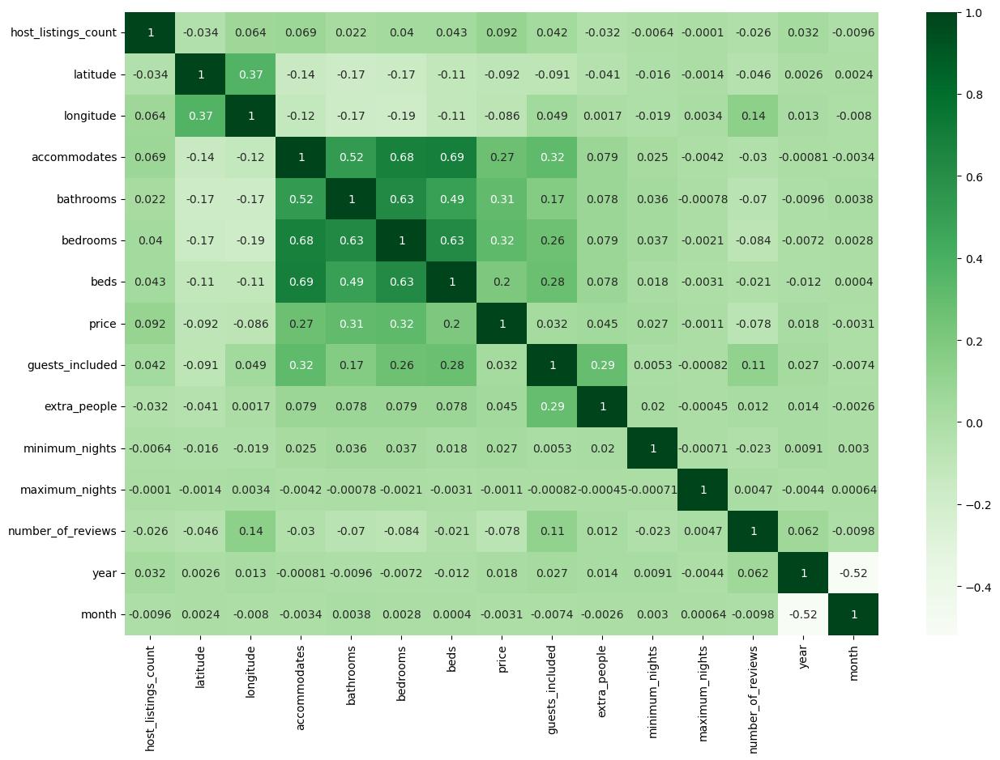

In [8]:
plt.figure(figsize=(15, 10))

sns.heatmap(base_airbnb.corr(numeric_only=True), annot=True, cmap='Greens') 
print(base_airbnb.corr(numeric_only=True))

#### Funções outliers

In [9]:
def limites(coluna):
    q1 = coluna.quantile(0.25) 
    q3 = coluna.quantile(0.75) 
    amplitude = q3 - q1
    return q1 - 1.5 * amplitude, q3 + 1.5 * amplitude 
    
def excluir_outliers(df, nome_coluna):
    qtde_linhas = df.shape[0] 
    lim_inf, lim_sup = limites(df[nome_coluna]) 
    df = df.loc[(df[nome_coluna] >= lim_inf) & (df[nome_coluna] <= lim_sup), :] 
    linhas_removidas = qtde_linhas - df.shape[0]
    return df,  linhas_removidas

#### Funções para a construção de gráficos

In [10]:
def diagrama_caixa(coluna):
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(15, 5)
    # apresenta todos os dados
    sns.boxplot(x=coluna, ax=ax1)
    # apresenta valores dentro dos limites inferior e superior
    ax2.set_xlim(limites(coluna))
    sns.boxplot(x=coluna, ax=ax2)
    
def histograma(coluna):
    plt.figure(figsize=(15, 5))
    # apresenta linha de densidade dos dados no histograma
    sns.histplot(coluna, kde=True) 

def grafico_barra(coluna):  
    plt.figure(figsize=(15, 5))
    ax = sns.barplot(x=coluna.value_counts().index, y=coluna.value_counts())
    ax.set_xlim(limites(coluna))

#### price

In [11]:
print(limites(base_airbnb['price']))
base_airbnb['price'].describe()

(-524.0, 1276.0)


count    897709.000000
mean        647.922241
std        1705.104980
min           0.000000
25%         151.000000
50%         297.000000
75%         601.000000
max      138288.000000
Name: price, dtype: float64

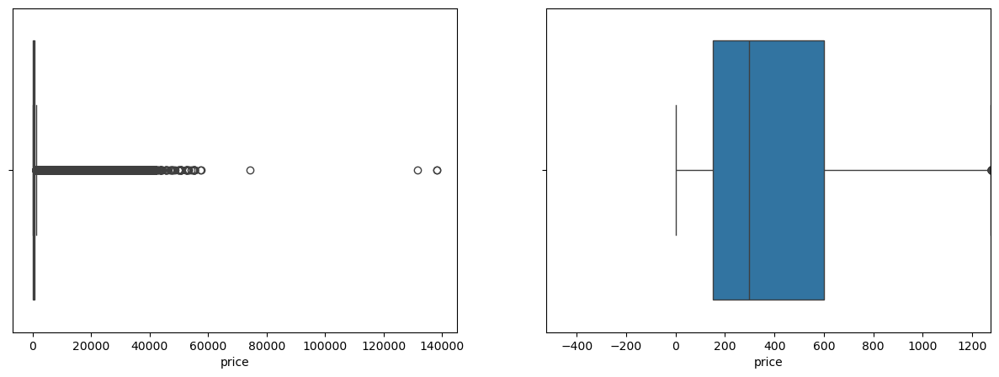

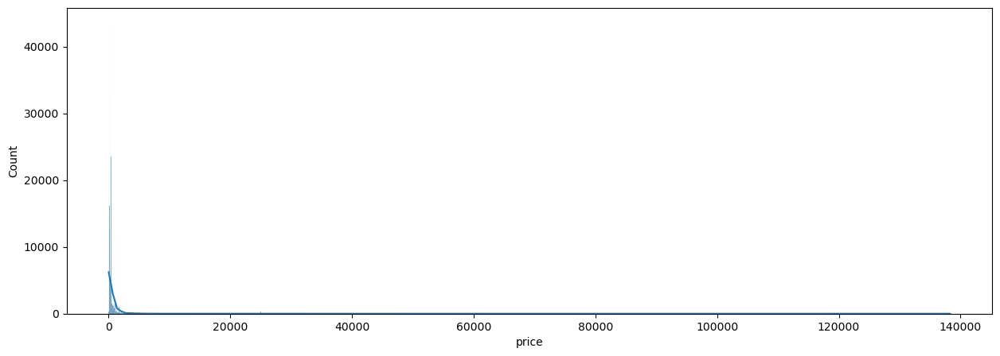

In [12]:
diagrama_caixa(base_airbnb['price'])
histograma(base_airbnb['price'])

- Considerando um modelo para imóveis comuns, valores acima do limite superior serão apenas de imóveis de altíssimo luxo, o que não é o objetivo principal do projeto. Por isso, serão excluídos os outliers.

In [13]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'price')
print('{} linhas removidas'.format(linhas_removidas))

87282 linhas removidas


(810427, 23)


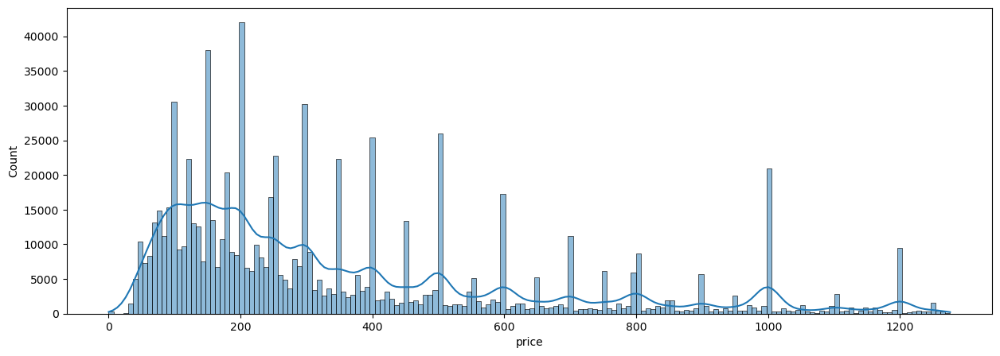

In [14]:
histograma(base_airbnb['price'])
print(base_airbnb.shape)

#### extra_people

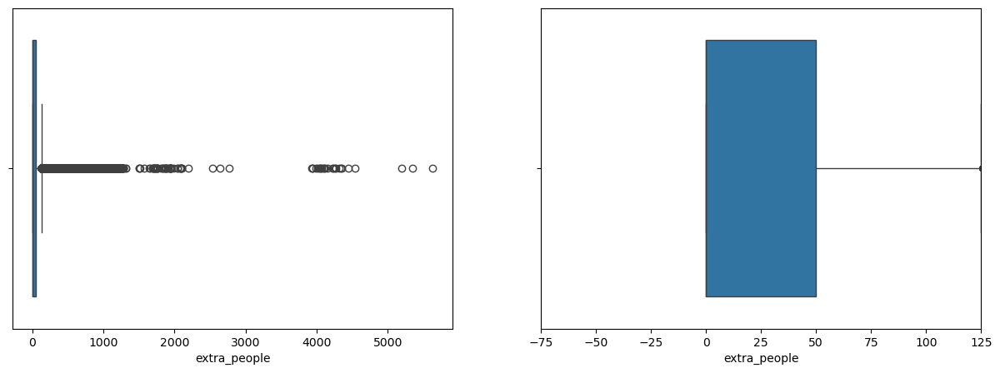

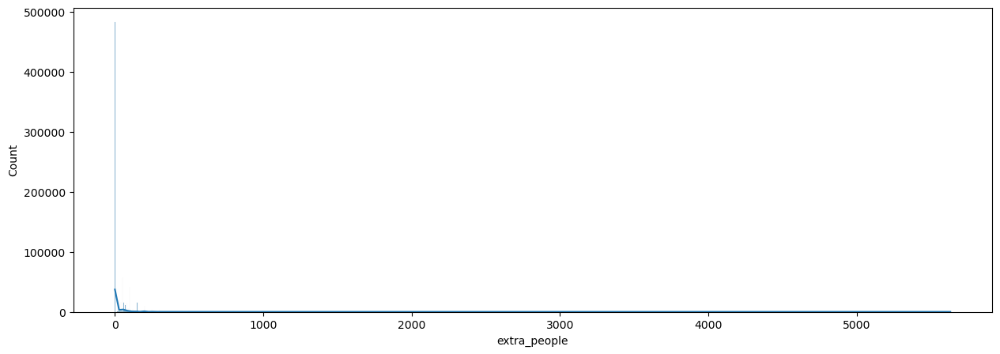

In [15]:
diagrama_caixa(base_airbnb['extra_people'])
histograma(base_airbnb['extra_people'])

- Há uma grande dispariedade nos dados indicando que muitos hosts não flexibilizam no número de pessoas. Por esse motivo, serão excluídos os outliers.

In [16]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'extra_people')
print('{} linhas removidas'.format(linhas_removidas))

59194 linhas removidas


(751233, 23)


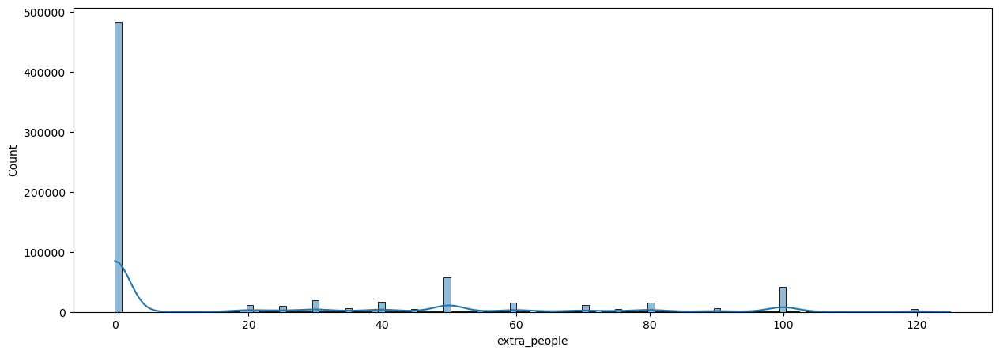

In [17]:
histograma(base_airbnb['extra_people'])
print(base_airbnb.shape)

#### host_listings_count

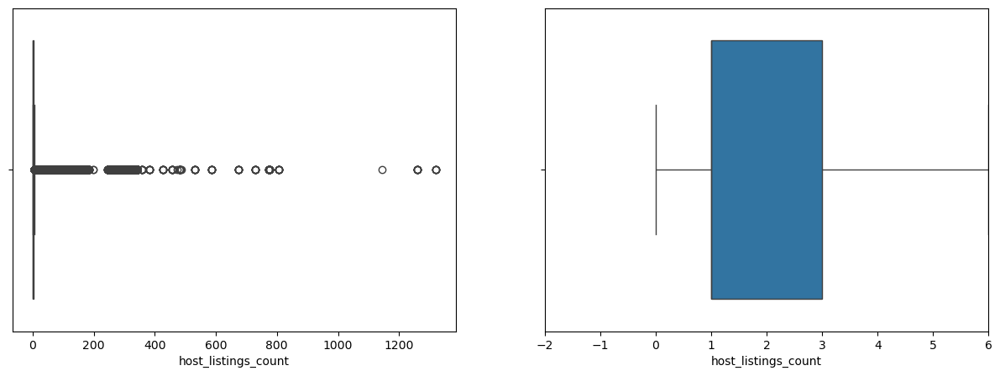

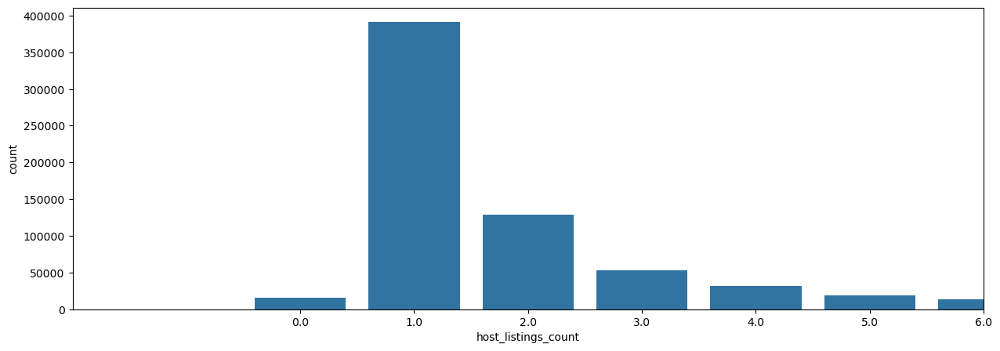

In [18]:
diagrama_caixa(base_airbnb['host_listings_count'])
grafico_barra(base_airbnb['host_listings_count'])

- Podemos excluir os outliers, porque o objetivo do projeto não são hosts com mais de 6 imóveis no airbnb.

In [19]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'host_listings_count')
print('{} linhas removidas'.format(linhas_removidas))

97723 linhas removidas


#### accommodates

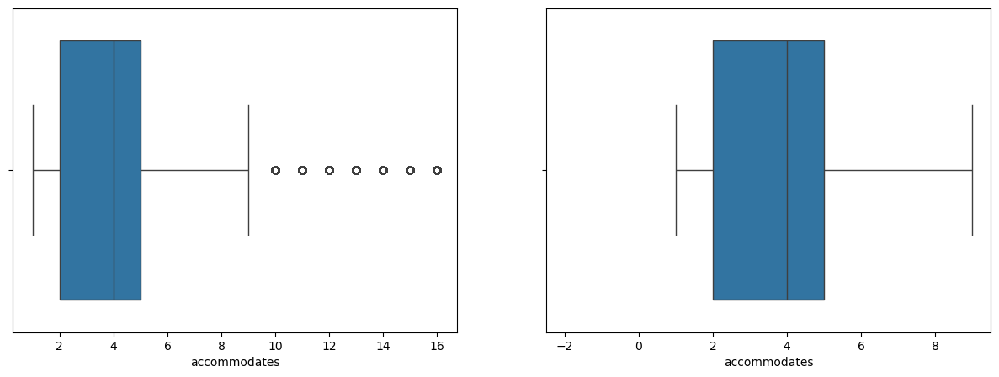

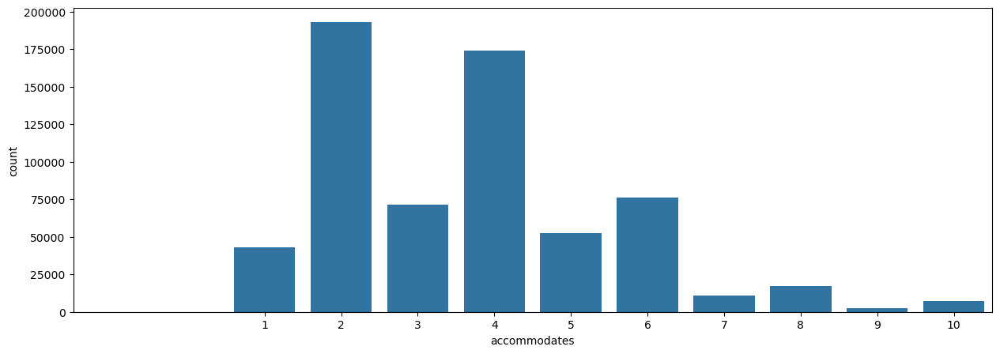

In [20]:
diagrama_caixa(base_airbnb['accommodates'])
grafico_barra(base_airbnb['accommodates'])

- Será excluído os outliers dessa coluna que acomodam mais de 9 pessoas, pois não é o foco, o objetivo é imóveis comuns.

- Para imóveis de alto padrão, manteria-se essa variável e o modelo poderia ser focado em imóvei com mais de 9 acomodações.

In [21]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'accommodates')
print('{} linhas removidas'.format(linhas_removidas))

13146 linhas removidas


#### bathrooms 

<Axes: xlabel='bathrooms', ylabel='count'>

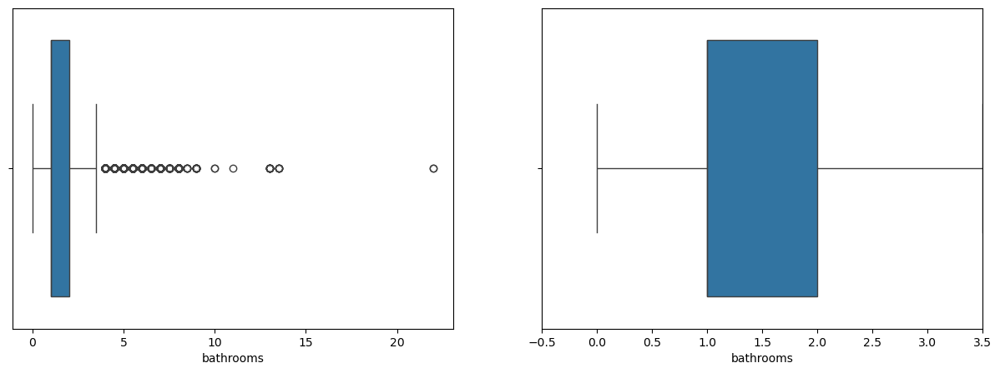

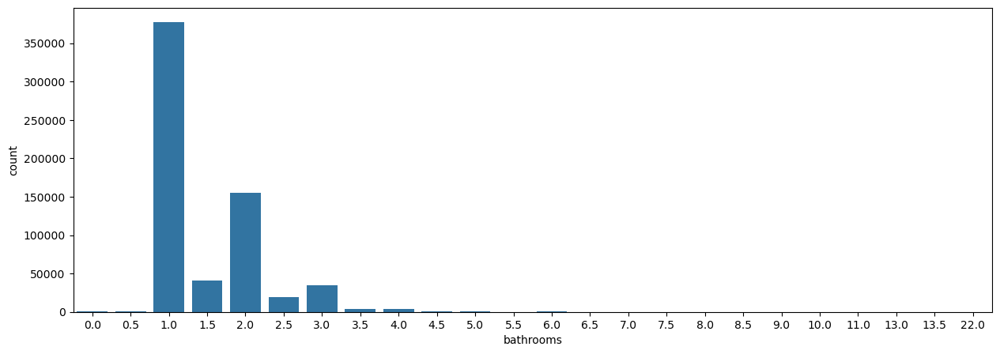

In [22]:
diagrama_caixa(base_airbnb['bathrooms'])
plt.figure(figsize=(15, 5))
sns.barplot(x=base_airbnb['bathrooms'].value_counts().index, y=base_airbnb['bathrooms'].value_counts())

- Pelo mesmo motivo dos anteriores, excluir os outliers nos banheiros.

In [23]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'bathrooms')
print('{} linhas removidas'.format(linhas_removidas))

6894 linhas removidas


#### bedrooms

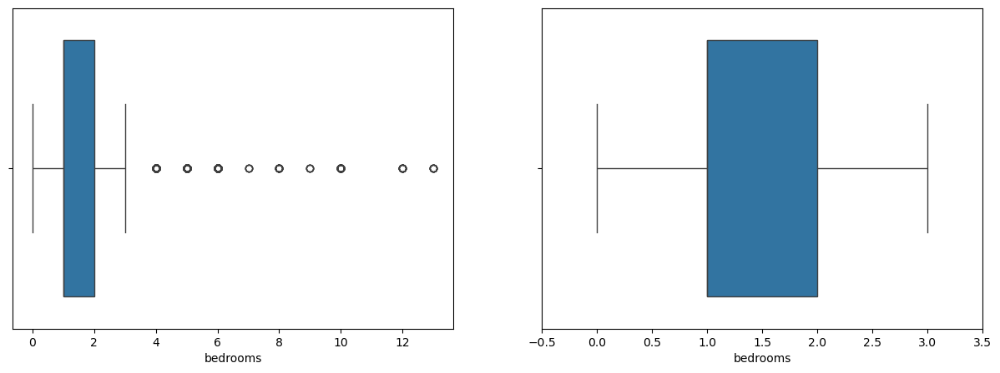

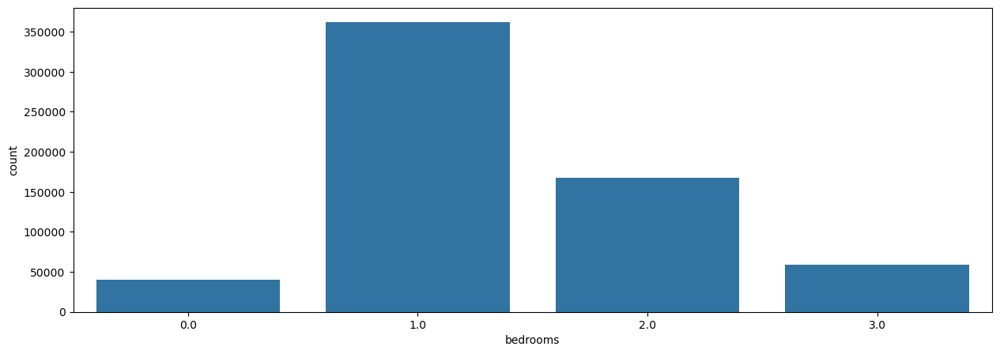

In [24]:
diagrama_caixa(base_airbnb['bedrooms'])
grafico_barra(base_airbnb['bedrooms'])

- Pelo mesmo motivo dos anteriores, excluir outliers em quantidade de quartos.

In [25]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'bedrooms')
print('{} linhas removidas'.format(linhas_removidas))

5482 linhas removidas


#### beds

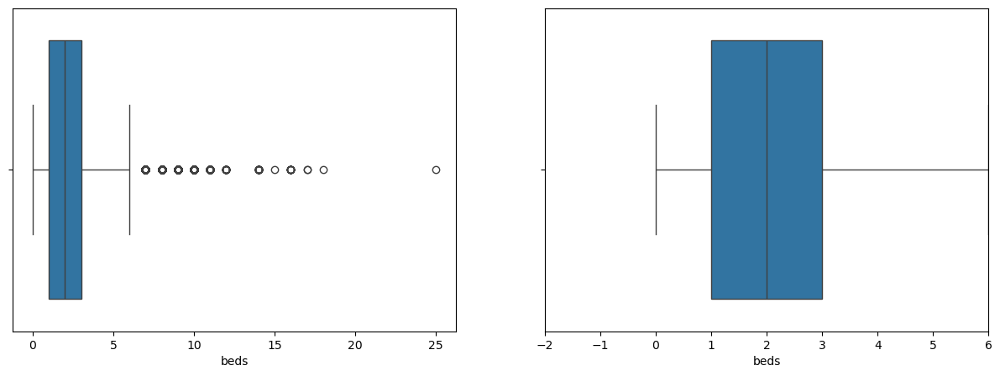

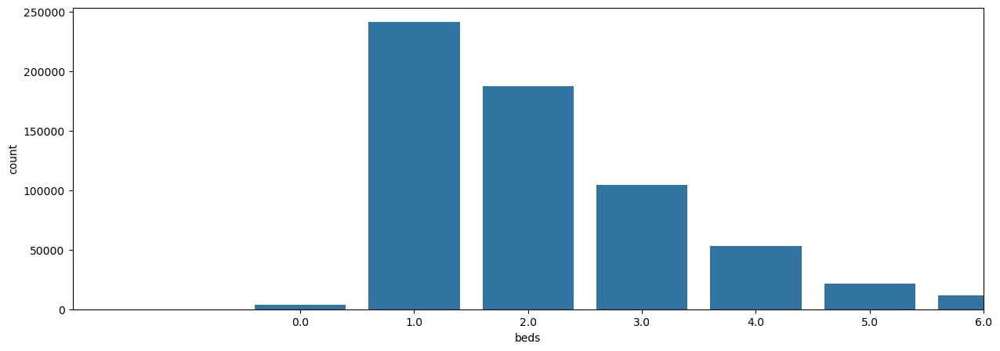

In [26]:
diagrama_caixa(base_airbnb['beds'])
grafico_barra(base_airbnb['beds'])

- Pelo mesmo motivo dos anteriores, excluir outliers em quantidade de camas.

In [27]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'beds')
print('{} linhas removidas'.format(linhas_removidas))

5622 linhas removidas


#### guests_included

(1.0, 1.0)


<Axes: xlabel='guests_included', ylabel='count'>

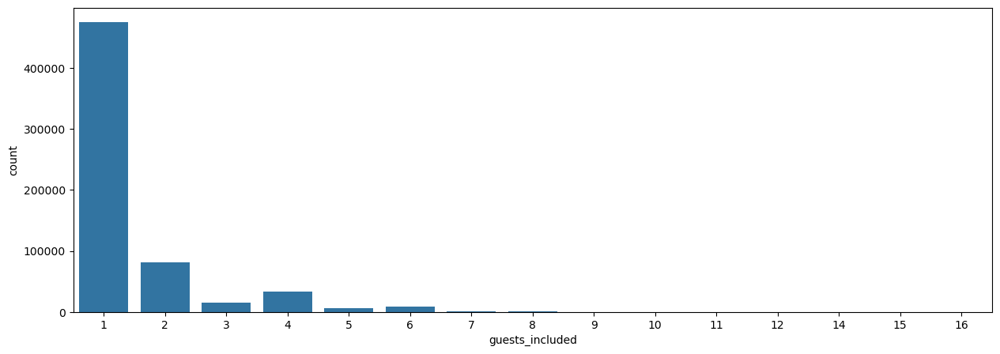

In [28]:
print(limites(base_airbnb['guests_included']))
plt.figure(figsize=(15, 5))
sns.barplot(x=base_airbnb['guests_included'].value_counts().index, y=base_airbnb['guests_included'].value_counts())

- Será removido essa feature da análise. Os usuários do airbnb usam muito o valor padrão do airbnb, 1 guest included, ou seja, mais de 40.000 usuários. O modelo pode interpretar a feature como não essencial para a definição do preço, por isso, será excluída.

In [29]:
base_airbnb = base_airbnb.drop('guests_included', axis=1)
base_airbnb.shape

(622366, 22)

#### minimum_nights

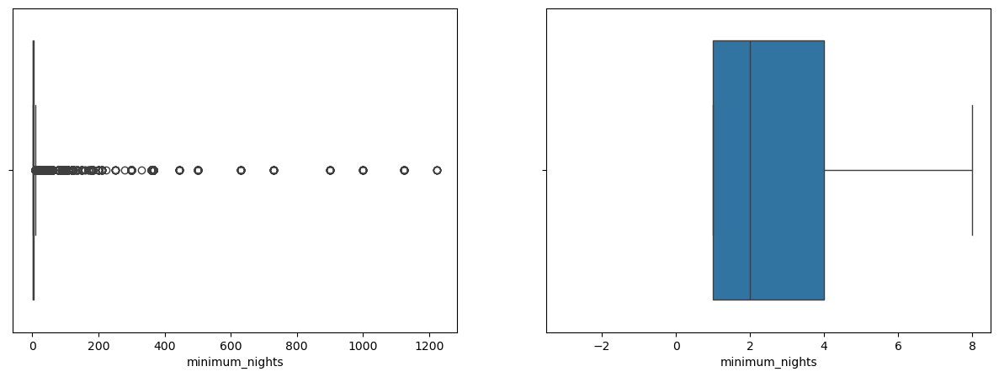

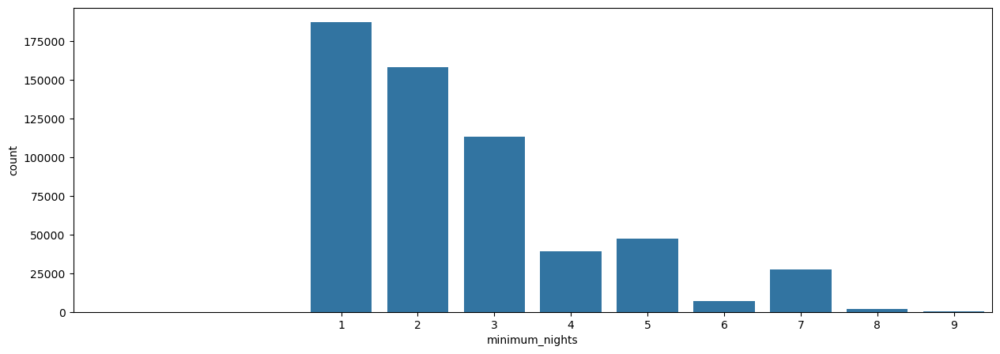

In [30]:
diagrama_caixa(base_airbnb['minimum_nights'])
grafico_barra(base_airbnb['minimum_nights'])

- Imóveis de locação com mais de 8 noites como o "mínimo de noites" podem ser imóveis de temporada ou ainda imóveis para morar, em que o host exige pelo menos 1 mês no imóvel. Como esse não é o objetivo, será excluído os outliers dessa coluna.

In [31]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'minimum_nights')
print('{} linhas removidas'.format(linhas_removidas))

40383 linhas removidas


#### maximum_nights

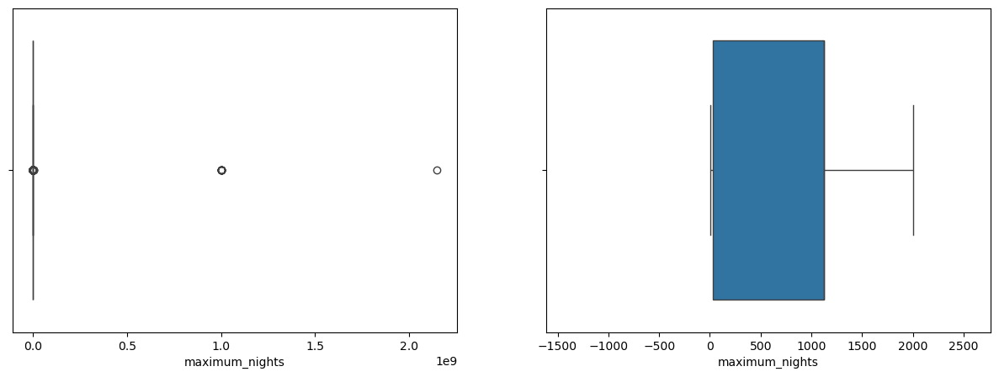

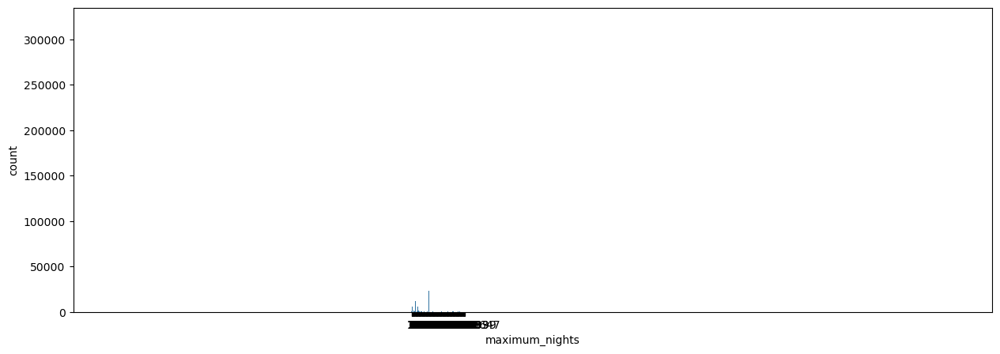

In [32]:
diagrama_caixa(base_airbnb['maximum_nights'])
grafico_barra(base_airbnb['maximum_nights'])

- Essa coluna não auxiliará na análise devido a dispariedade dos dados. Quase todos os hosts não preenchem esse campo. Sendo assim, essa feature será excluída da análise.

In [33]:
base_airbnb = base_airbnb.drop('maximum_nights', axis=1)
base_airbnb.shape

(581983, 21)

#### number_of_reviews            

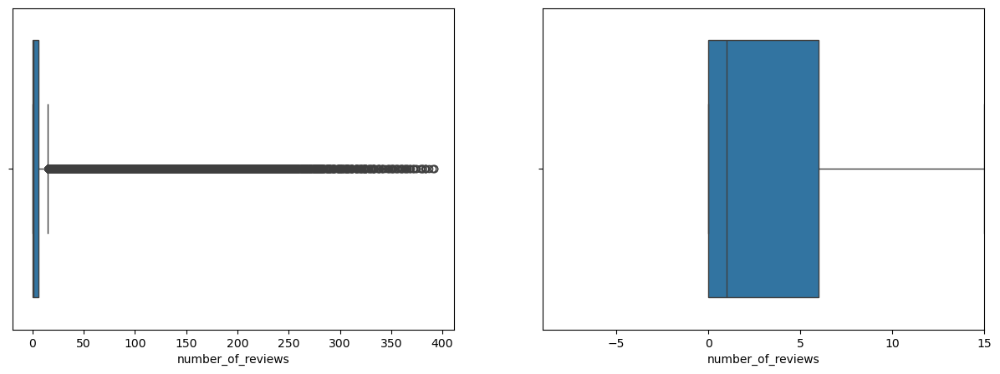

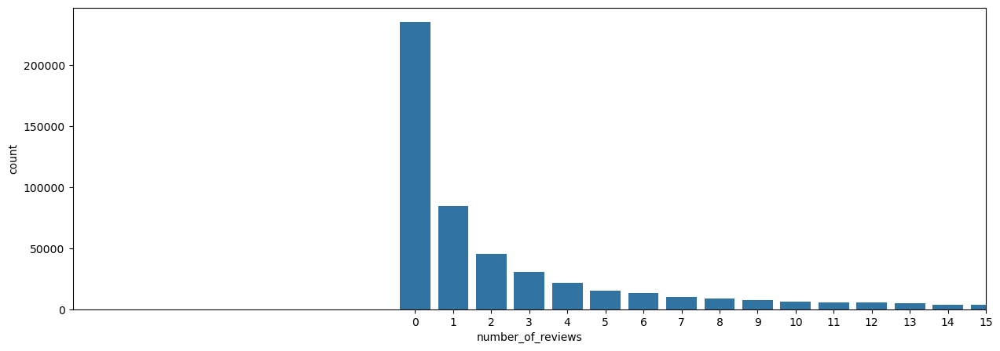

In [34]:
diagrama_caixa(base_airbnb['number_of_reviews'])
grafico_barra(base_airbnb['number_of_reviews'])


- Se excluir os outliers, será excluído as pessoas que tem a maior quantidade de reviews (o que pode ser os hosts que têm mais imóveis no airbnb). Isso pode impactar negativamente o modelo. No entanto, ao colocar um imóvel pela primeira vez para locação, não há review. Sendo assim, pode-se excluir essa feature.

In [35]:
base_airbnb = base_airbnb.drop('number_of_reviews', axis=1)
base_airbnb.shape

(581983, 20)

### Análise Exploratória de Dados Qualitativos

5. Por fim, analizar as colunas de texto. Definir quais colunas manter, agrupar e excluir outliers.

#### property_type 

property_type
Apartment                 458354
House                      51387
Condominium                26456
Serviced apartment         12671
Loft                       12352
Guest suite                 3621
Bed and breakfast           3472
Hostel                      2665
Guesthouse                  2155
Other                       1957
Villa                       1294
Townhouse                    969
Aparthotel                   693
Chalet                       481
Earth house                  468
Tiny house                   457
Boutique hotel               447
Hotel                        376
Casa particular (Cuba)       298
Cottage                      230
Bungalow                     207
Dorm                         185
Cabin                        141
Nature lodge                 124
Castle                        80
Treehouse                     76
Island                        54
Boat                          53
Hut                           40
Campsite                     

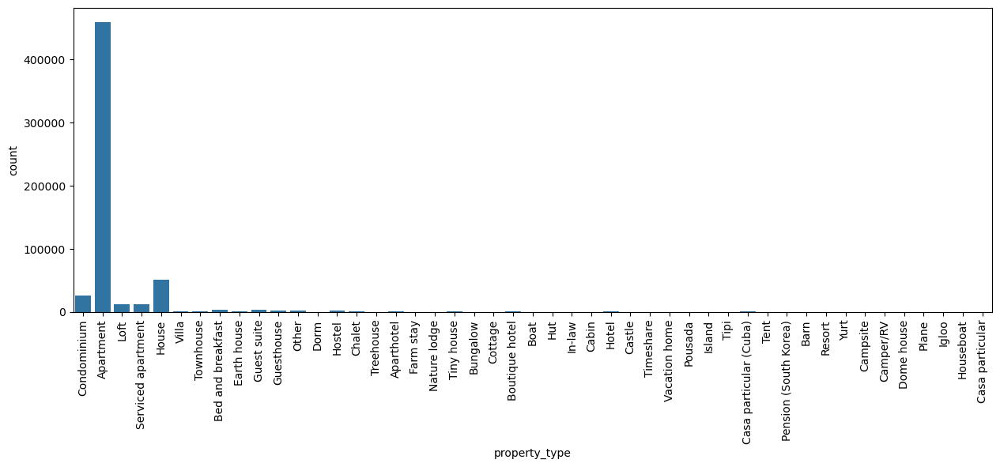

In [36]:
print(base_airbnb['property_type'].value_counts())

plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='property_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

- Todos os tipos de propriedade que têm menos de 2.000 propriedades na base de dados será agrupado em um grupo chamado "Outros". 

['Other', 'Villa', 'Townhouse', 'Aparthotel', 'Chalet', 'Earth house', 'Tiny house', 'Boutique hotel', 'Hotel', 'Casa particular (Cuba)', 'Cottage', 'Bungalow', 'Dorm', 'Cabin', 'Nature lodge', 'Castle', 'Treehouse', 'Island', 'Boat', 'Hut', 'Campsite', 'Resort', 'Camper/RV', 'Yurt', 'Tent', 'Tipi', 'Barn', 'Farm stay', 'Pension (South Korea)', 'Dome house', 'Igloo', 'In-law', 'Vacation home', 'Timeshare', 'Pousada', 'Houseboat', 'Casa particular', 'Plane']
property_type
Apartment             458354
House                  51387
Condominium            26456
Serviced apartment     12671
Loft                   12352
Outros                  8850
Guest suite             3621
Bed and breakfast       3472
Hostel                  2665
Guesthouse              2155
Name: count, dtype: int64


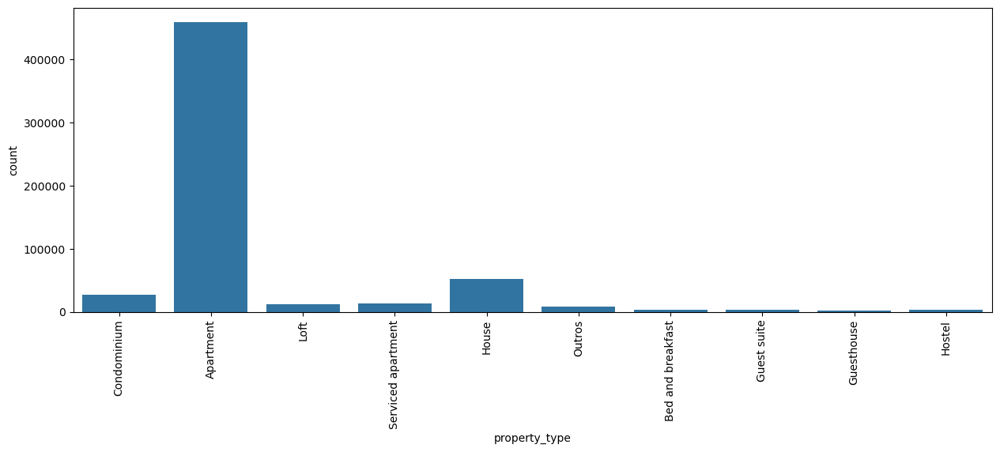

In [37]:
tabela_tipos_casa = base_airbnb['property_type'].value_counts() 

colunas_agrupar = []

for tipo in tabela_tipos_casa.index: 
    if tabela_tipos_casa[tipo] < 2000: 
        colunas_agrupar.append(tipo) 
print(colunas_agrupar)


for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['property_type']==tipo, 'property_type'] = 'Outros' 


print(base_airbnb['property_type'].value_counts())
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='property_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

#### room_type 

room_type
Entire home/apt    372443
Private room       196859
Shared room         11714
Hotel room            967
Name: count, dtype: int64


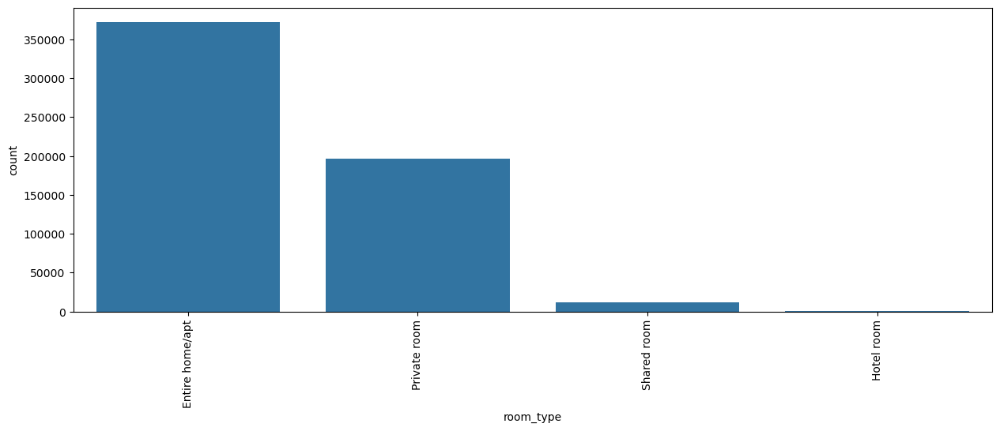

In [38]:
print(base_airbnb['room_type'].value_counts())

plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='room_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

- Tipo de quarto parece bem distribuído, não será modificada a coluna.

#### bed_type 

bed_type
Real Bed         570643
Pull-out Sofa      8055
Futon              1634
Airbed             1155
Couch               496
Name: count, dtype: int64


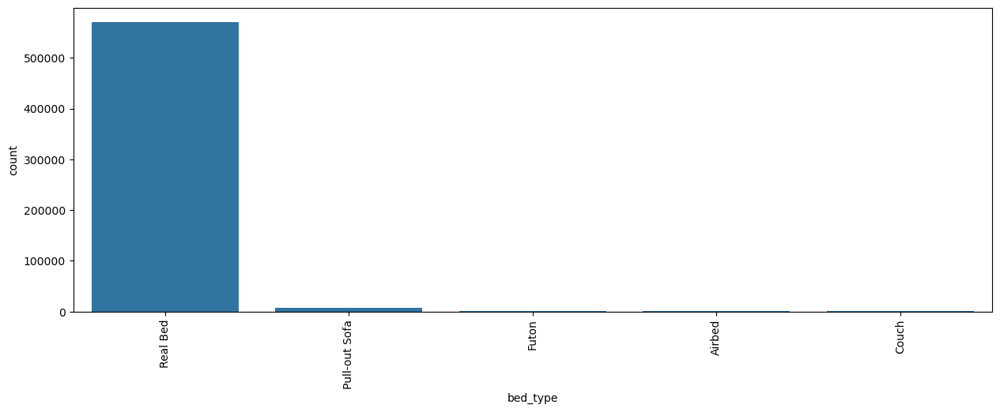

In [39]:
print(base_airbnb['bed_type'].value_counts())

plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='bed_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

- Agrupar categorias com poucas contagens. Como há uma quantidade bem maior de um tipo de cama, será criado dois grupos de camas: "Real Bed" e "Outros". Isso pode otimizar o modelo.

['Pull-out Sofa', 'Futon', 'Airbed', 'Couch']
bed_type
Real Bed    570643
Outros       11340
Name: count, dtype: int64


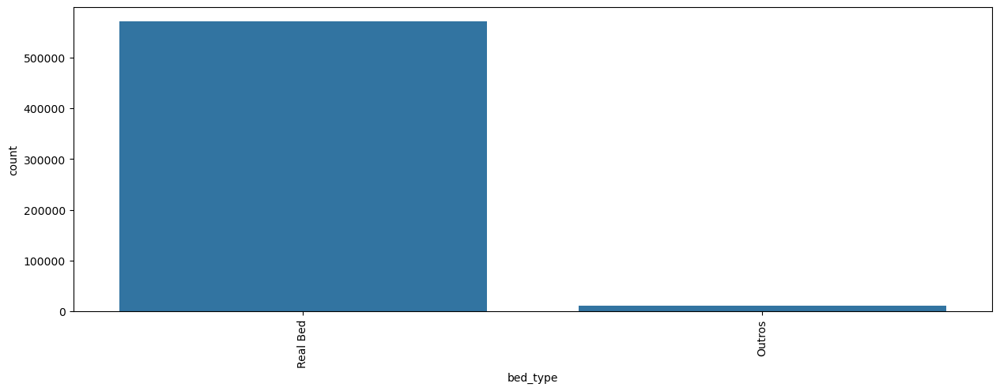

In [40]:
tabela_bed = base_airbnb['bed_type'].value_counts()
colunas_agrupar = []

for tipo in tabela_bed.index:
    if tabela_bed[tipo] < 10000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar)

for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['bed_type']==tipo, 'bed_type'] = 'Outros'

print(base_airbnb['bed_type'].value_counts())
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='bed_type', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

#### cancellation_policy 

cancellation_policy
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9696
super_strict_60                   135
super_strict_30                    32
Name: count, dtype: int64


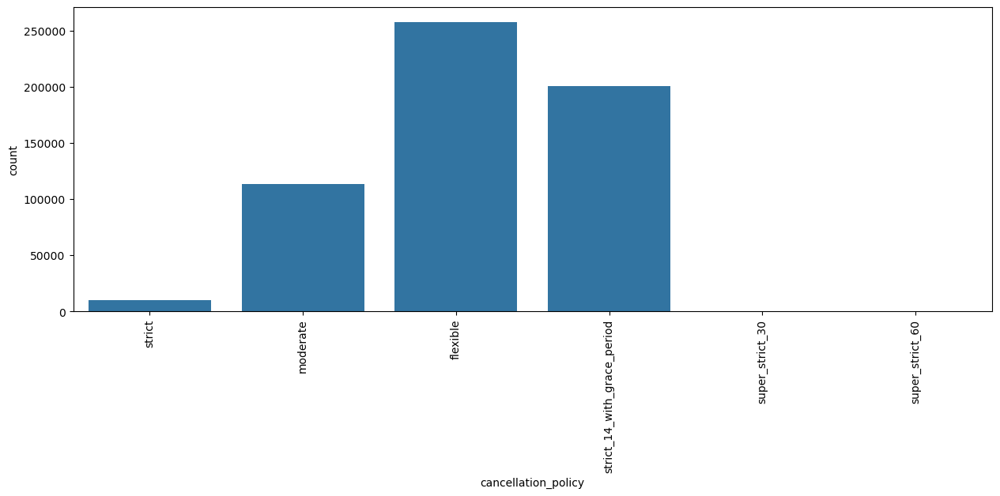

In [41]:
print(base_airbnb['cancellation_policy'].value_counts())

plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='cancellation_policy', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

- Agrupar categorias com poucas contagens. Contagens com menos de 1000 serão agrupadas em uma única categoria "strict".

['strict', 'super_strict_60', 'super_strict_30']
cancellation_policy
flexible                       258096
strict_14_with_grace_period    200743
moderate                       113281
strict                           9863
Name: count, dtype: int64


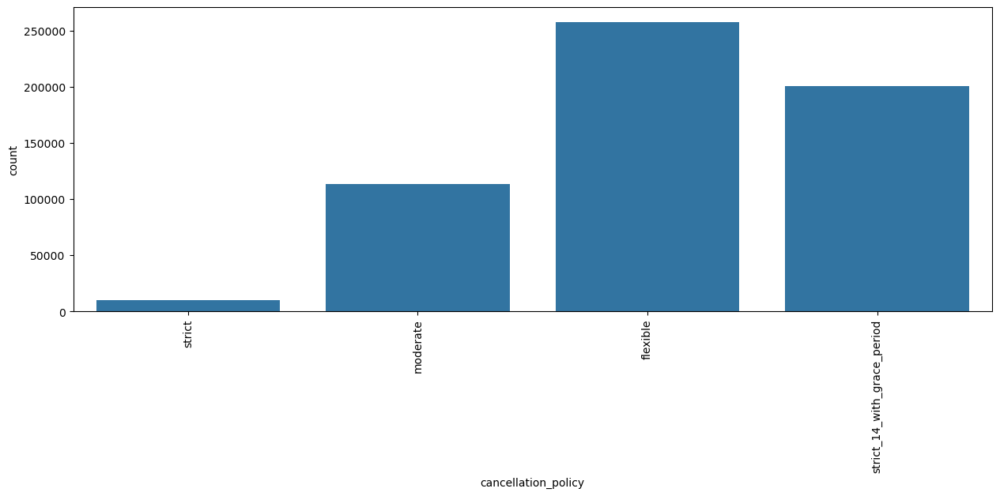

In [42]:
tabela_cancellation = base_airbnb['cancellation_policy'].value_counts()
colunas_agrupar = []

for tipo in tabela_cancellation.index:
    if tabela_cancellation[tipo] < 10000:
        colunas_agrupar.append(tipo)
print(colunas_agrupar)

for tipo in colunas_agrupar:
    base_airbnb.loc[base_airbnb['cancellation_policy']==tipo, 'cancellation_policy'] = 'strict'

print(base_airbnb['cancellation_policy'].value_counts())
plt.figure(figsize=(15, 5))
grafico = sns.countplot(x='cancellation_policy', data=base_airbnb)
grafico.tick_params(axis='x', rotation=90)

#### amenities 

In [43]:
# quantidade de amenities como parâmetro do modelo

print(base_airbnb['amenities'].iloc[1].split(',')) 
print(len(base_airbnb['amenities'].iloc[1].split(','))) 

# inserindo uma coluna n_amenities, número de amenities
base_airbnb['n_amenities'] = base_airbnb['amenities'].str.split(',').apply(len) 

['{TV', '"Cable TV"', 'Internet', 'Wifi', '"Air conditioning"', 'Kitchen', 'Doorman', 'Elevator', '"Buzzer/wireless intercom"', '"Family/kid friendly"', 'Hangers', '"Hair dryer"', 'Iron', '"Laptop friendly workspace"}']
14


In [44]:
base_airbnb = base_airbnb.drop('amenities', axis=1)
base_airbnb.shape

(581983, 20)

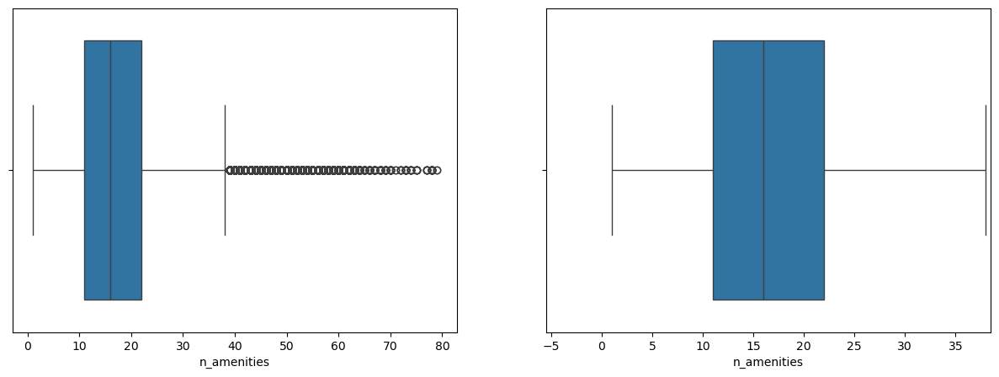

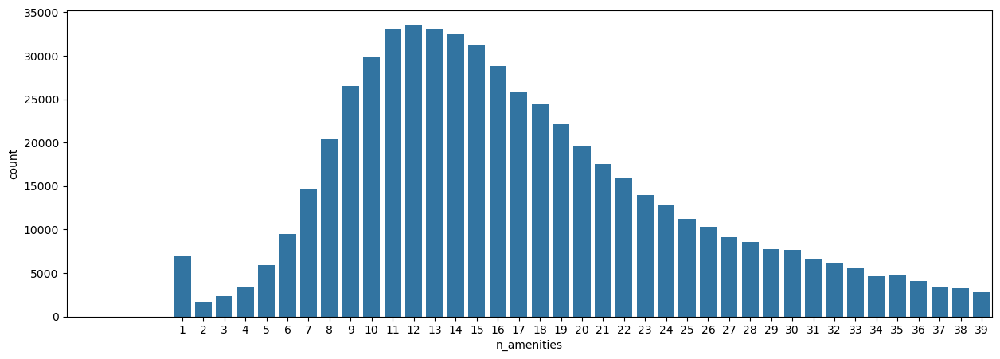

In [64]:
diagrama_caixa(base_airbnb['n_amenities'])
grafico_barra(base_airbnb['n_amenities'])

- Tornou-se uma coluna de valores numéricos e, como todas as outras colunas de valores numéricos, será excluído outliers.

In [45]:
base_airbnb, linhas_removidas = excluir_outliers(base_airbnb, 'n_amenities')
print('{} linhas removidas'.format(linhas_removidas))

24343 linhas removidas


### Visualização de Mapa das Propriedades

Mapa para exibir dados aleatório da base (50.000 propriedades) auxiliará na visualização da distribuição da propriedades pela cidade e na identificação dos locais de maior e menor preço.

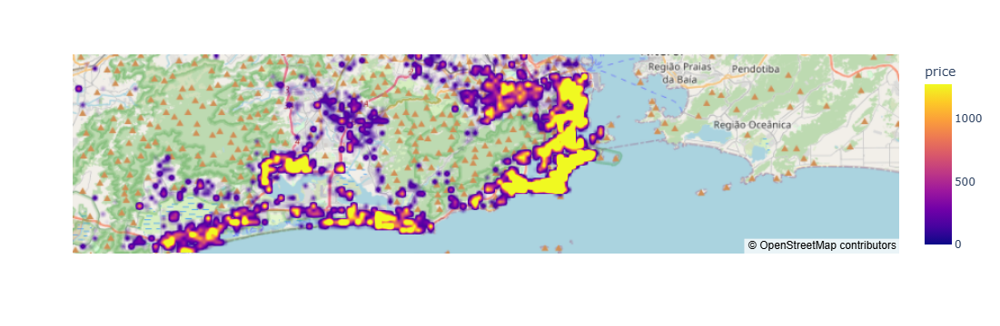

In [46]:
# selecionar 50000 valores aleatórios da base de dados
# utilizar os dados tratados de price 

amostra = base_airbnb.sample(n=50000)

centro_mapa = {'lat':amostra.latitude.mean(), 'lon':amostra.longitude.mean()}


mapa = px.density_mapbox(amostra, lat='latitude', lon='longitude',z='price', radius=2.5,
                       center=centro_mapa, zoom=10,
                       mapbox_style='open-street-map') 
mapa.show()

### Encoding

Ajustar as features de True ou False, e as features de categorias:

-Features de valores True ou False substituir True por 1 e False por 0.
-Features de categorias utilizar o método de encoding de variáveis dummies.

In [47]:
colunas_tf = ['host_is_superhost', 'instant_bookable', 'is_business_travel_ready']
base_airbnb_cod = base_airbnb.copy()
for coluna in colunas_tf:
    base_airbnb_cod.loc[base_airbnb_cod[coluna]=='t', coluna] = 1
    base_airbnb_cod.loc[base_airbnb_cod[coluna]=='f', coluna] = 0

In [48]:
colunas_categorias = ['property_type', 'room_type', 'bed_type', 'cancellation_policy']

base_airbnb_cod = pd.get_dummies(data=base_airbnb_cod, columns=colunas_categorias)
display(base_airbnb_cod.head())

,host_is_superhost,host_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,extra_people,...,room_type_Entire home/apt,room_type_Hotel room,room_type_Private room,room_type_Shared room,bed_type_Outros,bed_type_Real Bed,cancellation_policy_flexible,cancellation_policy_moderate,cancellation_policy_strict,cancellation_policy_strict_14_with_grace_period
1,1,2.0,-22.965919,-43.178962,5,1.0,2.0,2.0,270.0,51.0,...,True,False,False,False,False,True,False,False,True,False
3,0,3.0,-22.977117,-43.190454,3,1.0,1.0,2.0,161.0,45.0,...,True,False,False,False,False,True,False,False,True,False
4,1,1.0,-22.983024,-43.214270,3,1.0,1.0,2.0,222.0,68.0,...,True,False,False,False,False,True,False,False,True,False
5,1,1.0,-22.988165,-43.193588,3,1.5,1.0,2.0,308.0,86.0,...,True,False,False,False,False,True,False,False,True,False
6,1,1.0,-22.981269,-43.190457,2,1.0,1.0,2.0,219.0,80.0,...,True,False,False,False,False,True,False,False,True,False


### Modelo de Previsão

Métricas de avaliação:

-R² coeficiente de determinação ( varia entre 0 e 1) mostrará o quão bem o modelo consegue explicar o preço. Isso seria um ótimo parâmetro para ver o quão bom é nosso modelo <br> Quanto mais próximo de 100%, melhor.

-RSME raiz do erro quadrático médio mostrará o quanto o modelo está errando. <br> Quanto menor for o erro, melhor.


In [49]:
def avaliar_modelo(nome_modelo, y_teste, previsao):
    r2 = r2_score(y_teste, previsao)
    RSME = np.sqrt(mean_squared_error(y_teste, previsao)) 
    return f'Modelo {nome_modelo}:\nR²:{r2:.2%}\nRSME:{RSME:.2f}' 

Modelos a serem testados:

- RandomForest <br>
- LinearRegression<br>
- Extra Tree

In [50]:
modelo_rf = RandomForestRegressor()
modelo_lr = LinearRegression()
modelo_et = ExtraTreesRegressor()

modelos = {'RandomForest': modelo_rf,
          'LinearRegression': modelo_lr,
          'ExtraTrees': modelo_et,
          }

# pegar os dados do encoding
y = base_airbnb_cod['price'] 
X = base_airbnb_cod.drop('price', axis=1) 

Dados de teste e de treino do modelo:

- Separar as informações em treino e teste. Passar para o modelo os dados de treino, depois passar os dados de teste.

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

for nome_modelo, modelo in modelos.items():
    #treinar
    modelo.fit(X_train, y_train) 
    #testar
    previsao = modelo.predict(X_test) 
    print(avaliar_modelo(nome_modelo, y_test, previsao))

Modelo RandomForest:
R²:97.24%
RSME:44.06
Modelo LinearRegression:
R²:32.70%
RSME:217.54
Modelo ExtraTrees:
R²:97.50%
RSME:41.92


### Analisar Modelos

In [52]:
# para rodar mais rápido, retira-se fit por já ter sido treinado

for nome_modelo, modelo in modelos.items():
    #testar
    previsao = modelo.predict(X_test)
    print(avaliar_modelo(nome_modelo, y_test, previsao))

Modelo RandomForest:
R²:97.24%
RSME:44.06
Modelo LinearRegression:
R²:32.70%
RSME:217.54
Modelo ExtraTrees:
R²:97.50%
RSME:41.92


Modelo escolhido ExtraTressRegressor:

- Com maior valor de R² e ao mesmo tempo o menor valor de RSME. Não houve uma grande diferença de velocidade de treino e de previsão desse modelo com o modelo de RandomForest (que teve resultados próximos de R² e RSME), no entanto optou-se pelo Modelo ExtraTrees.
    
Resultados das métricas de avaliação do modelo escolhido:<br>

Modelo ExtraTrees:<br>
R²:97.48%<br>
RSME:42.08

### Ajustes no Modelo

,0
bedrooms,0.117653
latitude,0.104057
longitude,0.101475
n_amenities,0.088709
extra_people,0.086595
accommodates,0.076067
bathrooms,0.069185
minimum_nights,0.065006
room_type_Entire home/apt,0.060160
beds,0.052796


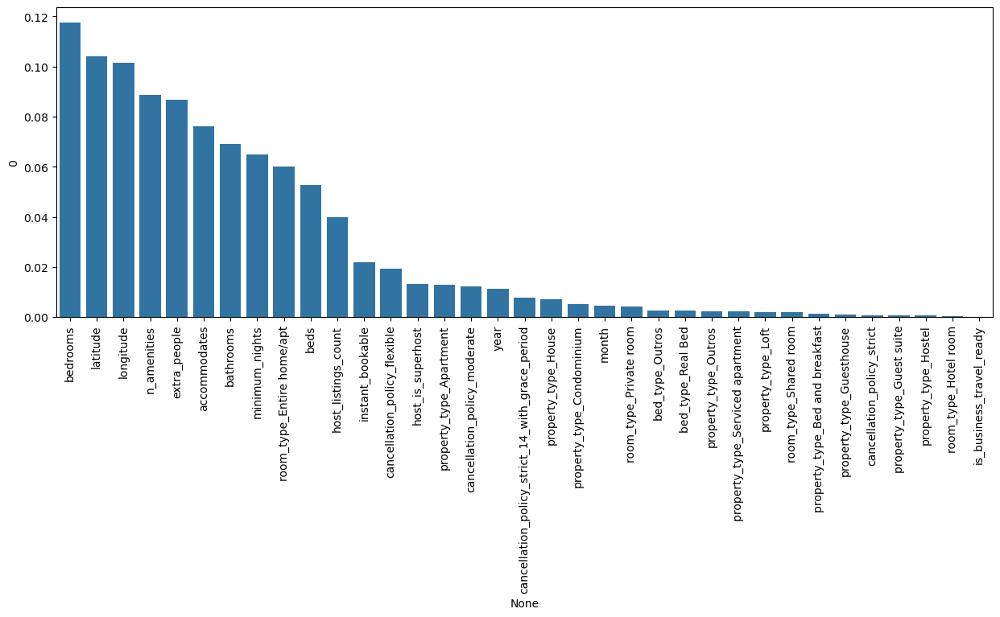

In [53]:
# dataframe com features seus respectivos percentuais de importância

importancia_features = pd.DataFrame(modelo_et.feature_importances_, X_train.columns) 
importancia_features = importancia_features.sort_values(by=0, ascending=False)
display(importancia_features)

# gráfico com features e seus respectivos percentuais de importância
plt.figure(figsize=(15, 5))
ax = sns.barplot(x=importancia_features.index, y=importancia_features[0])
ax.tick_params(axis='x', rotation=90)

- is_business_travel ready não parece ter muito impacto no modelo. Por isso, com o objetivo de otimizar o modelo, será excluída essa feature e será testado o modelo sem ela.

In [54]:
# excluir feature para novo teste
base_airbnb_cod = base_airbnb_cod.drop('is_business_travel_ready', axis=1)

# dados 
y = base_airbnb_cod['price']
X = base_airbnb_cod.drop('price', axis=1)

# separando dados de teste e treino em dois 2 grupos
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

# treino usa parte dos dados contido no grupo treino e teste
modelo_et.fit(X_train, y_train)

# teste usa parte dos dados contido em teste e treino 
previsao = modelo_et.predict(X_test)

# teste final e previsão
print(avaliar_modelo('ExtraTrees', y_test, previsao))

Modelo ExtraTrees:
R²:97.48%
RSME:42.08


- Resultado indicou impactos positivos no modelo com a retirada da coluna.

- "room_type Hotel room" não foi excluída porque existe mais colunas room_type, no entanto pode-se agrupar as colunas room_type. Não se deve retirar mais de uma coluna por vez para poder visualizar como a coluna está impactando no modelo.

In [55]:
base_teste = base_airbnb_cod.copy()

for coluna in base_teste:
    if 'bed_type' in coluna:    
        base_teste = base_teste.drop(coluna, axis=1) 



# dados 
y = base_teste['price']
X = base_teste.drop('price', axis=1)

# separando dados de teste e de treino em dois 2 grupos
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10)

modelo_et.fit(X_train, y_train)
previsao = modelo_et.predict(X_test)

print(avaliar_modelo('ExtraTrees', y_test, previsao))

Modelo ExtraTrees:
R²:97.48%
RSME:42.10


In [56]:
# valor correspondente a coluna em Index, ou seja, valores correspondentes a coluna em Index
print(previsao)

[101.   998.53 249.18 ... 128.34 271.53 119.91]


In [60]:
# base de dados X não possuía coluna price, essa será introduzida nos dados
X['price'] = y
X.to_csv('dados.csv')

### Para deploy do projeto

Para exportar o modelo e para que ele possa ser lido por outro arquivo pyhton, use joblib. No nome do arquivo indique a extensão joblib para demonstrar a necessidade a quem for utilizar o arquivo.

In [61]:
import joblib

# variável a ser exportada (modelo_et) e nome do arquivo
joblib.dump(modelo_et, 'modelo.joblib')

['modelo.joblib']